In [39]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from matplotlib.lines import Line2D

import seaborn as sns
import plotly.express as px

from sklearn.inspection import partial_dependence

import yaml

import math
import pandas as pd

try:
    from statsmodels.nonparametric.smoothers_lowess import lowess
    HAS_LOWESS = True
except ImportError:
    HAS_LOWESS = False

In [40]:

# --- Publication-style rcParams ---
mpl.rcParams.update({
    'font.family': 'serif',
    'font.size': 11,
    'axes.labelsize': 11,
    'axes.titlesize': 12,
    'axes.edgecolor': '#333333',
    'axes.linewidth': 0.8,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'figure.dpi': 150,
    'savefig.dpi': 300,
    'svg.fonttype': 'none',
})

# Essential Params and Dicts
def make_sequential_group_colors(groups, cmap_name="Greens", low=0.25, high=0.95):
    """
    Generate a dict of {group: hex_color} using a sequential colormap.
    low/high trim the very lightest and darkest ends so colors stay
    visible against a white background and distinct from black text/lines.
    """
    cmap = plt.get_cmap(cmap_name)
    n = len(groups)
    colors = [cmap(low + (high - low) * i / (n - 1)) for i in range(n)]
    return {g: mcolors.to_hex(c) for g, c in zip(groups, colors)}


def _lowess_fit(x, y, frac=0.4, n_bins=20):
    """
    Fit a LOWESS smooth (or binned-mean fallback) and return:
    - x_sorted, y_smooth: the smooth curve for plotting
    - y_fitted_at_x: smooth values aligned back to the original x order,
      for R² and slope calculations against the actual data
    """
    order = np.argsort(x)
    x_sorted = x[order]

    if HAS_LOWESS:
        smoothed = lowess(y[order], x_sorted, frac=frac, return_sorted=True)
        x_smooth, y_smooth = smoothed[:, 0], smoothed[:, 1]
        # aligned fitted values at original x, for R² / slope stats
        y_fitted_at_x = lowess(y, x, frac=frac, return_sorted=False)
        return x_smooth, y_smooth, y_fitted_at_x

    # Fallback: binned mean, then interpolate back onto original x
    bins = np.linspace(x_sorted.min(), x_sorted.max(), n_bins + 1)
    bin_idx = np.clip(np.digitize(x_sorted, bins) - 1, 0, n_bins - 1)
    x_binned, y_binned = [], []
    for b in range(n_bins):
        mask = bin_idx == b
        if mask.sum() > 0:
            x_binned.append(x_sorted[mask].mean())
            y_binned.append(y[order][mask].mean())
    x_binned, y_binned = np.array(x_binned), np.array(y_binned)
    y_fitted_at_x = np.interp(x, x_binned, y_binned)
    return x_binned, y_binned, y_fitted_at_x


def _lowess_slope_and_zero(x_smooth, y_smooth):
    """
    Summarize a (possibly nonlinear) LOWESS curve with a single slope
    (least-squares line through the smoothed curve) and its zero-crossing.
    If the curve crosses zero multiple times, returns the first crossing
    found by interpolation; falls back to the linear estimate otherwise.
    """
    slope, intercept = np.polyfit(x_smooth, y_smooth, 1)

    # Look for an actual sign change along the smoothed curve first —
    # more faithful to a nonlinear LOWESS than the straight-line estimate.
    sign_changes = np.where(np.diff(np.sign(y_smooth)) != 0)[0]
    if len(sign_changes) > 0:
        i = sign_changes[0]
        x0, x1 = x_smooth[i], x_smooth[i + 1]
        y0, y1 = y_smooth[i], y_smooth[i + 1]
        x_zero = x0 + (0 - y0) * (x1 - x0) / (y1 - y0)
    elif slope != 0:
        x_zero = -intercept / slope
    else:
        x_zero = np.nan

    return slope, x_zero


def plot_shap_with_line_stats_v4(
    df,
    features,
    color="#56B4E9",
    line_color="#65625F",
    y_axis_limits=None,
    shap_prefix="shap_",
    group=None,
    n_cols=5,
    lowess_frac=0.4,
    name=None,
):
    """
    Plot SHAP dependence with a LOWESS trend line, from a wide-format
    dataframe where each feature has a matching shap_<feature> column.
    Slope and zero-crossing are derived from the LOWESS curve rather
    than a separate linear regression.
    """
    slopes = []
    zeros = []
    n_plots = len(features)
    n_rows = math.ceil(n_plots / n_cols)

    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(4.6 * n_cols, 4.2 * n_rows),
        squeeze=False
    )
    axes = axes.reshape(-1)

    for ax, var in zip(axes, features):
        shap_col = f"{shap_prefix}{var}"

        if var not in df.columns or shap_col not in df.columns:
            print(f"Skipping {var}: column(s) not found ({var}, {shap_col})")
            ax.set_visible(False)
            slopes.append(np.nan)
            zeros.append(np.nan)
            continue

        feature_values = df[var].values.astype(float)
        shap_feature = df[shap_col].values.astype(float)

        valid = ~(np.isnan(feature_values) | np.isnan(shap_feature))
        feature_values, shap_feature = feature_values[valid], shap_feature[valid]

        if len(feature_values) < 5 or np.all(feature_values == feature_values[0]):
            ax.set_visible(False)
            slopes.append(np.nan)
            zeros.append(np.nan)
            continue

        # --- LOWESS fit ---
        x_smooth, y_smooth, y_fitted_at_x = _lowess_fit(
            feature_values, shap_feature, frac=lowess_frac
        )
        slope, x_zero = _lowess_slope_and_zero(x_smooth, y_smooth)
        slopes.append(slope)
        zeros.append(x_zero)

        # R² of the LOWESS fit against the actual data
        ss_res = np.sum((shap_feature - y_fitted_at_x) ** 2)
        ss_tot = np.sum((shap_feature - shap_feature.mean()) ** 2)
        r2 = 1 - ss_res / ss_tot if ss_tot != 0 else np.nan

        # --- Y limits ---
        if y_axis_limits:
            ax.set_ylim(*y_axis_limits)
        else:
            y_min, y_max = shap_feature.min(), shap_feature.max()
            pad = (y_max - y_min) * 0.08 if y_max > y_min else 0.01
            ax.set_ylim(y_min - pad, y_max + pad)

        # Points
        ax.scatter(
            feature_values,
            shap_feature,
            alpha=0.12,
            s=8,
            color=color,
            linewidth=0,
            zorder=1,
            rasterized=True,
        )

        # LOWESS trend line
        ax.plot(
            x_smooth,
            y_smooth,
            color=line_color,
            linestyle="--",
            linewidth=2.4,
            zorder=4,
            label=f"LOWESS (R²={r2:.2f}, slope={slope:.4f})",
        )

        ax.axhline(0, color="#333333", linestyle=":", linewidth=0.8, alpha=0.5, zorder=2)

        # Clean spines + gridlines
        for spine in ['top', 'right']:
            ax.spines[spine].set_visible(False)
        ax.grid(axis='y', color='#eeeeee', linewidth=0.5, zorder=0)
        ax.set_axisbelow(True)

        ax.set_xlabel(var, fontweight='medium')
        ax.set_ylabel("SHAP value")
        ax.set_title(var, fontweight='bold', fontsize=11, pad=8)
        ax.legend(fontsize=7.5, frameon=False, loc="best")

    for ax in axes[n_plots:]:
        ax.set_visible(False)

    title = f"SHAP Dependence — {group}" if group is not None else "SHAP Dependence"
    fig.suptitle(title, y=1.02, fontsize=14, fontweight='bold')
    fig.subplots_adjust(hspace=0.55, wspace=0.35)

    if name:
        fig.savefig(name, dpi=300, bbox_inches="tight")

    plt.show()

    return slopes, zeros


In [41]:
def _trend_line(x, y, frac=0.4, n_bins=20):
    """Return smoothed (x_sorted, y_smooth) via LOWESS, or a binned-mean
    fallback if statsmodels isn't available."""
    order = np.argsort(x)
    x_sorted, y_sorted = x[order], y[order]

    if HAS_LOWESS:
        smoothed = lowess(y_sorted, x_sorted, frac=frac, return_sorted=True)
        return smoothed[:, 0], smoothed[:, 1]

    # Fallback: binned mean
    bins = np.linspace(x_sorted.min(), x_sorted.max(), n_bins + 1)
    bin_idx = np.digitize(x_sorted, bins) - 1
    bin_idx = np.clip(bin_idx, 0, n_bins - 1)
    x_binned, y_binned = [], []
    for b in range(n_bins):
        mask = bin_idx == b
        if mask.sum() > 0:
            x_binned.append(x_sorted[mask].mean())
            y_binned.append(y_sorted[mask].mean())
    return np.array(x_binned), np.array(y_binned)

def plot_shap(
    df,
    features,
    color="#56B4E9",
    line_color="#D55E00",
    y_axis_limits=(-0.03, 0.03),
    shap_prefix="shap_",
    n_cols=5,
    name=None,
    title=None,
    lowess_frac=0.4,
):
    """
    Plot SHAP dependence for each feature, with a LOWESS trend line,
    from a wide-format dataframe where each feature has a matching
    shap_<feature> column.
    """
    n_plots = len(features)
    n_rows = math.ceil(n_plots / n_cols)

    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(4.6 * n_cols, 4.2 * n_rows),
        squeeze=False
    )
    axes = axes.reshape(-1)

    for ax, var in zip(axes, features):
        shap_col = f"{shap_prefix}{var}"

        if var not in df.columns or shap_col not in df.columns:
            print(f"Skipping {var}: column(s) not found ({var}, {shap_col})")
            ax.set_visible(False)
            continue

        feature_values = df[var].values.astype(float)
        shap_feature = df[shap_col].values.astype(float)

        valid = ~(np.isnan(feature_values) | np.isnan(shap_feature))
        feature_values, shap_feature = feature_values[valid], shap_feature[valid]

        if len(feature_values) < 5 or np.all(feature_values == feature_values[0]):
            ax.set_visible(False)
            continue

        # Points
        ax.scatter(
            feature_values,
            shap_feature,
            alpha=0.08,
            s=10,
            color=color,
            linewidth=0,
            zorder=1,
            rasterized=True,  # keeps vector PDFs from bloating with dense scatter
        )

        # LOWESS trend line
        x_smooth, y_smooth = _trend_line(feature_values, shap_feature, frac=lowess_frac)
        ax.plot(
            x_smooth,
            y_smooth,
            color=line_color,
            linewidth=2.2,
            zorder=4,
        )

        if y_axis_limits:
            ax.set_ylim(*y_axis_limits)
        ax.axhline(0, color="#333333", linestyle="--", linewidth=0.8, alpha=0.5, zorder=2)

        # Clean spines + gridlines
        for spine in ['top', 'right']:
            ax.spines[spine].set_visible(False)
        ax.grid(axis='y', color='#eeeeee', linewidth=0.5, zorder=0)
        ax.set_axisbelow(True)

        ax.set_xlabel(var, fontweight='medium')
        ax.set_ylabel("SHAP value")
        ax.set_title(var, fontweight='bold', fontsize=11, pad=8)

    for ax in axes[n_plots:]:
        ax.set_visible(False)

    fig.suptitle(title or "Overall SHAP Dependence Plots", y=1.06, fontsize=14, fontweight='bold')
    fig.subplots_adjust(hspace=0.55, wspace=0.35, top=0.88)

    if name:
        fig.savefig(name, dpi=300, bbox_inches="tight")

    return fig

def plot_shap_by_continuous(
    df,
    features,
    color_var,               # name of the continuous column to color points by
    cmap="viridis",
    shap_prefix="shap_",
    n_cols=5,
    name=None,
    title=None,
    lowess_frac=0.4,
    trend_color="#D55E00",   # single global trend line color (contrasts with most cmaps)
    color_var_label=None,    # optional display label for the colorbar
    vmin=None,
    vmax=None,
):
    """
    Plot SHAP dependence with points colored by a continuous variable
    (shared colormap + colorbar across all panels), and a single pooled
    trend line per feature (fit across all data, ignoring color_var).
    """
    n_plots = len(features)
    n_rows = math.ceil(n_plots / n_cols)

    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(4.6 * n_cols, 4.2 * n_rows),
        squeeze=False
    )
    axes = axes.reshape(-1)

    # Shared color scale across all panels, so colors are comparable subplot-to-subplot
    if color_var not in df.columns:
        raise ValueError(f"color_var '{color_var}' not found in df.columns")
    c_all = df[color_var].values.astype(float)
    c_valid = c_all[~np.isnan(c_all)]
    vmin = c_valid.min() if vmin is None else vmin
    vmax = c_valid.max() if vmax is None else vmax
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)

    last_scatter = None

    for ax, var in zip(axes, features):
        shap_col = f"{shap_prefix}{var}"

        if var not in df.columns or shap_col not in df.columns:
            print(f"Skipping {var}: column(s) not found ({var}, {shap_col})")
            ax.set_visible(False)
            continue

        feature_values = df[var].values.astype(float)
        shap_feature = df[shap_col].values.astype(float)
        c_values = df[color_var].values.astype(float)

        valid = ~(np.isnan(feature_values) | np.isnan(shap_feature) | np.isnan(c_values))
        feature_values, shap_feature, c_values = (
            feature_values[valid], shap_feature[valid], c_values[valid]
        )

        if len(feature_values) < 5 or np.all(feature_values == feature_values[0]):
            ax.set_visible(False)
            continue

        # Points colored by the continuous variable
        last_scatter = ax.scatter(
            feature_values,
            shap_feature,
            c=c_values,
            cmap=cmap,
            norm=norm,
            alpha=0.2,
            s=6,
            linewidth=0,
            zorder=1,
            rasterized=True,  # keeps vector PDFs from bloating with dense scatter
        )

        # Single global trend line (pooled, ignores color_var)
        x_smooth, y_smooth = _trend_line(feature_values, shap_feature, frac=lowess_frac)
        ax.plot(
            x_smooth, y_smooth,
            color=trend_color,
            linewidth=2.4,
            zorder=4,
            solid_capstyle='round',
        )

        ax.set_ylim(-0.03, 0.03)
        ax.axhline(0, color="#333333", linestyle="--", linewidth=0.8, alpha=0.5, zorder=2)

        for spine in ['top', 'right']:
            ax.spines[spine].set_visible(False)
        ax.grid(axis='y', color='#eeeeee', linewidth=0.5, zorder=0)
        ax.set_axisbelow(True)

        ax.set_xlabel(var, fontweight='medium')
        ax.set_ylabel("SHAP value")
        ax.set_title(var, fontweight='bold', fontsize=11, pad=8)

    for ax in axes[n_plots:]:
        ax.set_visible(False)

    # Shared colorbar for the continuous variable
    if last_scatter is not None:
        sm = ScalarMappable(norm=norm, cmap=cmap)
        sm.set_array([])
        cbar = fig.colorbar(
            sm, ax=axes[:n_plots].tolist(),
            orientation='horizontal',
            fraction=0.02, pad=0.06,
            location='top'
        )
        cbar.set_label(color_var_label or color_var, fontsize=10)
        cbar.ax.tick_params(labelsize=8)

    # Trend-line legend entry (kept separate from the colorbar)
    legend_elements = [
        Line2D([0], [0], color=trend_color, lw=2.4, label="Overall trend (LOWESS)")
    ]
    fig.legend(
        handles=legend_elements,
        loc='upper right',
        bbox_to_anchor=(0.99, 1.0),
        frameon=False,
        fontsize=10,
    )

    fig.suptitle(title or "Overall SHAP Dependence Plots", y=1.1, fontsize=14, fontweight='bold')
    fig.subplots_adjust(hspace=0.55, wspace=0.35, top=0.85)

    if name:
        fig.savefig(name, dpi=300, bbox_inches="tight")

    return fig

def plot_shap_by_group(
    df,
    features,
    group_color_map,          # dict: {biome_name: color}
    group_col="biome",
    shap_prefix="shap_",
    n_cols=5,
    name=None,
    title=None,
    lowess_frac=0.4,
    trend_color="#333333",   # single global trend line color
):
    """
    Plot SHAP dependence with points colored per biome, but a single
    pooled trend line per feature (fit across all groups combined).
    Colors come from group_color_map.
    """
    groups = [g for g in group_color_map.keys() if g in df[group_col].unique()]

    missing = set(df[group_col].dropna().unique()) - set(group_color_map.keys())
    if missing:
        print(f"Warning: these groups have no color mapping and will be skipped: {missing}")

    n_plots = len(features)
    n_rows = math.ceil(n_plots / n_cols)

    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(4.6 * n_cols, 4.2 * n_rows),
        squeeze=False
    )
    axes = axes.reshape(-1)

    for ax, var in zip(axes, features):
        shap_col = f"{shap_prefix}{var}"

        if var not in df.columns or shap_col not in df.columns:
            print(f"Skipping {var}: column(s) not found ({var}, {shap_col})")
            ax.set_visible(False)
            continue

        # --- Plot points per group first ---
        for g in groups:
            sub = df[df[group_col] == g]
            feature_values = sub[var].values.astype(float)
            shap_feature = sub[shap_col].values.astype(float)

            if len(feature_values) == 0 or np.all(feature_values == feature_values[0]):
                continue

            color = group_color_map[g]

            ax.scatter(
                feature_values,
                shap_feature,
                alpha=0.08,
                s=10,
                color=color,
                linewidth=0,
                zorder=1,
                rasterized=True,  # keeps vector PDFs from bloating with dense scatter
            )

        # --- Single global trend line, pooled across all groups ---
        all_feature_values = df[var].values.astype(float)
        all_shap_feature = df[shap_col].values.astype(float)
        valid = ~(np.isnan(all_feature_values) | np.isnan(all_shap_feature))

        if valid.sum() >= 5:
            x_smooth, y_smooth = _trend_line(
                all_feature_values[valid], all_shap_feature[valid], frac=lowess_frac
            )
            ax.plot(
                x_smooth, y_smooth,
                color=trend_color,
                linewidth=2.4,
                zorder=4,
                solid_capstyle='round',
            )

        ax.set_ylim(-0.03, 0.03)
        ax.axhline(0, color="#333333", linestyle="--", linewidth=0.8, alpha=0.5, zorder=2)

        # Clean spines
        for spine in ['top', 'right']:
            ax.spines[spine].set_visible(False)
        ax.grid(axis='y', color='#eeeeee', linewidth=0.5, zorder=0)
        ax.set_axisbelow(True)

        ax.set_xlabel(var, fontweight='medium')
        ax.set_ylabel("SHAP value")
        ax.set_title(var, fontweight='bold', fontsize=11, pad=8)

    for ax in axes[n_plots:]:
        ax.set_visible(False)

    # Legend: group colors + the trend line
    legend_elements = [
        Line2D([0], [0], color=group_color_map[g], lw=2.5, marker='o',
               linestyle='None', markersize=6, label=g)
        for g in groups
    ]
    legend_elements.append(
        Line2D([0], [0], color=trend_color, lw=2.4, label="Overall trend (LOWESS)")
    )
    fig.legend(
        handles=legend_elements,
        loc='upper center',
        bbox_to_anchor=(0.5, 1.0),
        ncol=min(len(legend_elements), 6),
        frameon=False,
        fontsize=10,
    )

    fig.suptitle(title or "Overall SHAP Dependence Plots", y=1.06, fontsize=14, fontweight='bold')
    fig.subplots_adjust(hspace=0.55, wspace=0.35, top=0.88)

    if name:
        fig.savefig(name, dpi=300, bbox_inches="tight")

    return fig

In [42]:


biome_colors = {
    'Temperate broadleaf forests': "#4881BE",   # Sea Green (mid-tone green)
    'Temperate conifer forests':   "#016742",   # Very Dark Green (near-black green)
    'Temperate grasslands':        '#DAA520',   # Goldenrod (yellow-brown)
    'Xeric shrublands':             '#B5651D',   # Burnt Orange-Brown (desert)
    'Boreal and Tundra forests':    '#4169E1',   # Royal Blue (cool, distinct from green)
    'Mediterranean woodlands':      '#9ACD32',   # Yellow-Green (olive, warm-leaning)
    'Tropical':                     '#FF00FF',   # Magenta (maximally distinct, non-natural but unmistakable)
    'NaN':                          '#D3D3D3'    # Light Gray
}

with open("config/ex_config.yaml", "r") as f:
    config = yaml.safe_load(f)

biome_mapping = config["biome_mapping"]
random_key=config["random_key"]

biome_list=["Temperate broadleaf forests", "Temperate conifer forests", "Temperate grasslands",
            "Xeric shrublands", "Boreal and Tundra forests", "Tropical",
            "Mediterranean woodlands"]

In [43]:
df1=pd.read_csv('data/final/global_shap_values.csv')
df1=df1[[ 'PID','lon', 'lat','shap_Raos_Q', 'shap_Functional_Evenness',
                 'shap_Species Richness', 'shap_Shannon Diversity', 'shap_Simpson\'s Index']]

In [44]:
df1.columns

Index(['PID', 'lon', 'lat', 'shap_Raos_Q', 'shap_Functional_Evenness',
       'shap_Species Richness', 'shap_Shannon Diversity',
       'shap_Simpson's Index'],
      dtype='str')

In [ ]:
fd_df = pd.read_csv('data/final/final_dataset.csv')
PID_df= pd.read_csv('data/lookup/PID_location_v2.csv')

fd_df=fd_df.merge(PID_df[['PID','lat','lon', 'biome', 'percent_conifer']], on='PID', how='left')

fd_df.dropna(subset=['transformed npp', 'Raos_Q', 'Functional_Evenness', 'Soil Moisture',
                    'Species Richness', 'Shannon Diversity', "Simpson's Index", "pet_std"], inplace=True)
fd_df = fd_df[fd_df["treecover2000"] > 30]


fd_df.drop_duplicates(subset=['PID'], inplace=True)

npp_df=pd.read_csv('data/processed/PID_npp_volatility.csv')

npp_df=npp_df[['PID', 'mean']]

fd_df=fd_df.merge(npp_df, on='PID', how='left')

#Preprocessing the data for Random forest regression

fd_df['biome'] = fd_df['biome'].map(biome_mapping) # Only run this once ! 

biome_dfs = {k: v for k, v in fd_df.groupby('biome')}

fd_df = fd_df[fd_df["WSCI"] != 0]
fd_df = fd_df[fd_df["disturbance_value"] != -2147483648]


In [46]:

syndrome_df=pd.read_csv('data/processed/syndrome_varianece_per_pid1.csv')

In [47]:
fd_df=fd_df.merge(syndrome_df, on='PID', how='left')

In [48]:

q = 8

fd_df["WSCI_group"] = pd.qcut(
    fd_df["WSCI"],
    q=q,
    labels=[f"Q{i}" for i in range(1, q + 1)],
)

groups = [f"Q{i}" for i in range(1, q + 1)]
WSCI_group_colors = make_sequential_group_colors(groups, cmap_name="viridis")
print(WSCI_group_colors)

{'Q1': '#3b528b', 'Q2': '#2f6c8e', 'Q3': '#25848e', 'Q4': '#1e9c89', 'Q5': '#2fb47c', 'Q6': '#5ec962', 'Q7': '#9bd93c', 'Q8': '#dfe318'}


In [49]:

q = 4

fd_df["mean_npp_group"] = pd.qcut(
    fd_df["mean"],
    q=q,
    labels=[f"Q{i}" for i in range(1, q + 1)],
)

groups = [f"Q{i}" for i in range(1, q + 1)]
mean_npp_group_colors = make_sequential_group_colors(groups, cmap_name="viridis")
print(mean_npp_group_colors)

{'Q1': '#3b528b', 'Q2': '#228c8d', 'Q3': '#4cc26c', 'Q4': '#dfe318'}


In [50]:
# One group per unique species richness value
unique_richness = sorted(fd_df["Species Richness"].unique())
n_actual_bins = len(unique_richness)

print(f"{n_actual_bins} unique richness values: {unique_richness}")

# Map each richness value directly to a group label
richness_to_label = {val: f"Q{i}" for i, val in enumerate(unique_richness, start=1)}
fd_df["richness_group"] = fd_df["Species Richness"].map(richness_to_label)

# Build groups/colors off actual unique count
groups = [f"Q{i}" for i in range(1, n_actual_bins + 1)]
species_richness_group_colors = make_sequential_group_colors(groups, cmap_name="viridis")
print(species_richness_group_colors)

18 unique richness values: [np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19)]
{'Q1': '#3b528b', 'Q2': '#365d8d', 'Q3': '#31688e', 'Q4': '#2c718e', 'Q5': '#287c8e', 'Q6': '#25858e', 'Q7': '#21908d', 'Q8': '#1f998a', 'Q9': '#20a386', 'Q10': '#26ad81', 'Q11': '#34b679', 'Q12': '#44bf70', 'Q13': '#5ac864', 'Q14': '#73d056', 'Q15': '#8bd646', 'Q16': '#a8db34', 'Q17': '#c2df23', 'Q18': '#dfe318'}


In [51]:
df1=df1.merge(fd_df, on='PID', how='left', validate='1:1')

In [52]:
print(f"Correlation for {fd_df['Raos_Q'].corr(fd_df['Species Richness'], method='spearman')}")


Correlation for 0.5878272467231787


In [53]:
# df1=df1.merge(fd_df[['PID','biome','percent_conifer', 'Slope', "WSCI_group", 'WSCI', 'Elevation', 'Raos_Q', 'Functional_Evenness', 
#                     'Species Richness', 'Shannon Diversity', "Simpson's Index" ]], on='PID', how='left', validate='1:1')

In [54]:
features = ['Raos_Q', 'Functional_Evenness','Shannon Diversity', "Simpson's Index",  'Species Richness', ]


Correlation for Q1: 0.9999978975581962


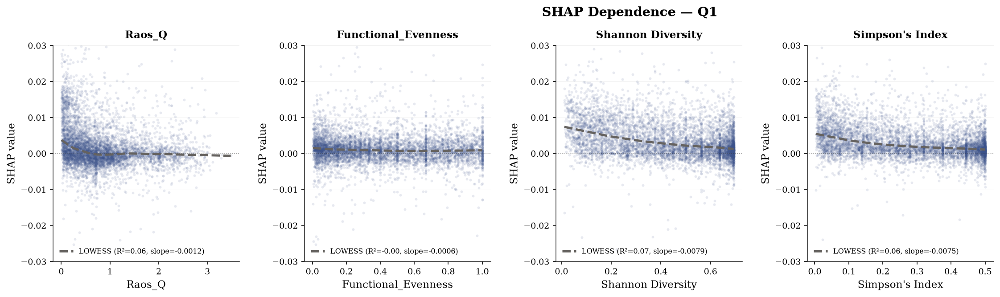

Correlation for Q10: 0.9705056352173131


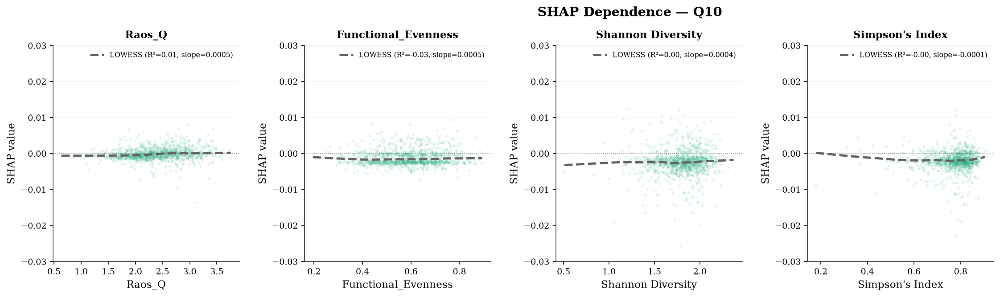

Correlation for Q11: 0.9680737665825717


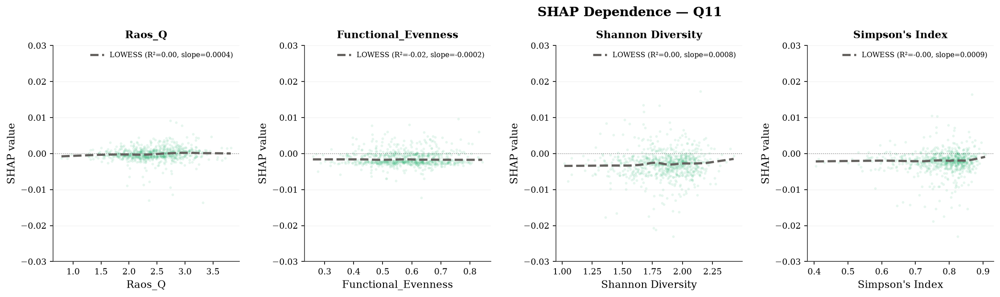

Correlation for Q12: 0.9695112195870325


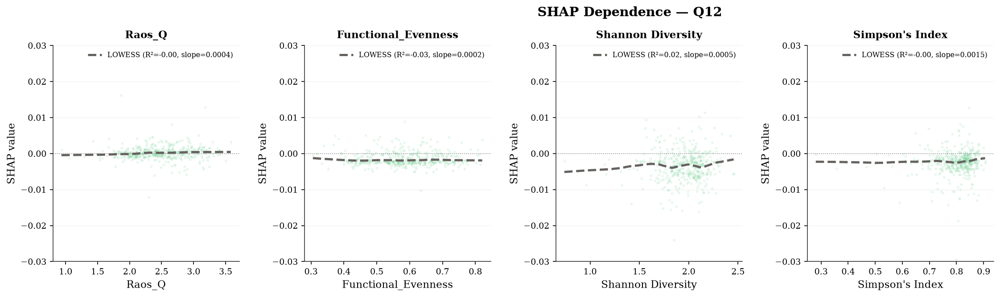

Correlation for Q13: 0.9661486943936562


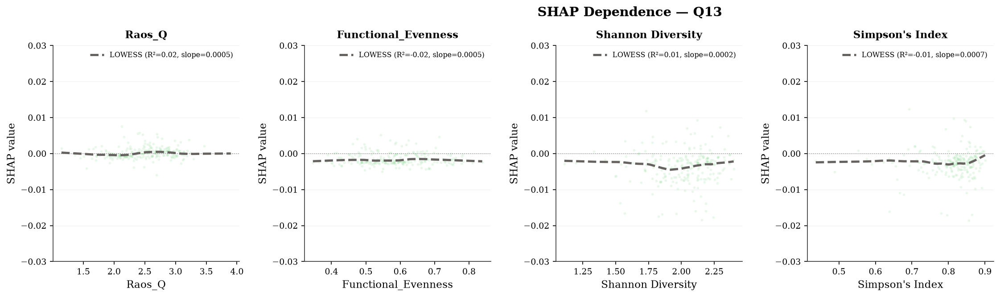

Correlation for Q14: 0.9606822433735268


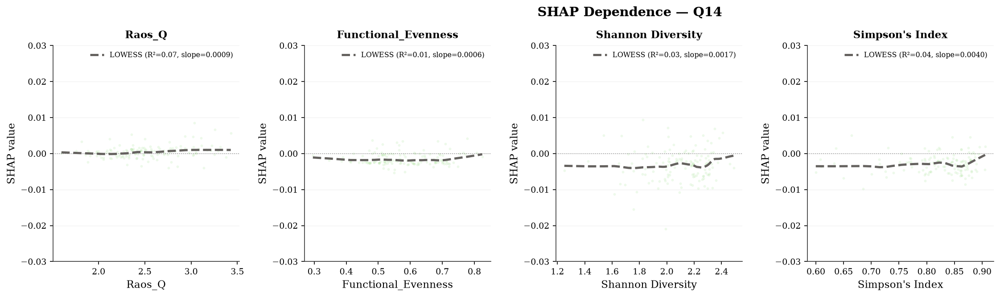

Correlation for Q15: 0.9758985200845666


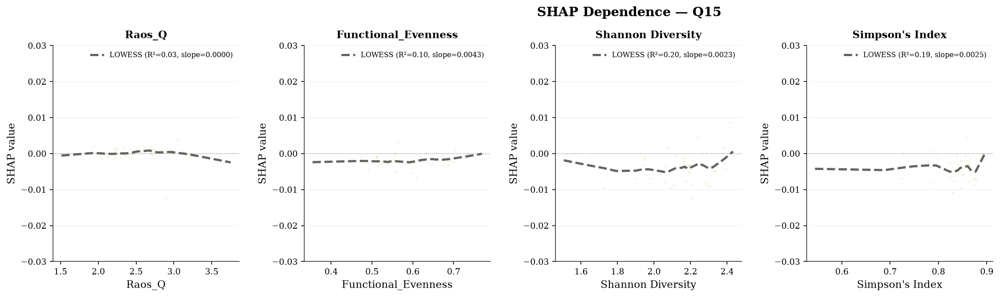

Correlation for Q16: 0.9644268774703558


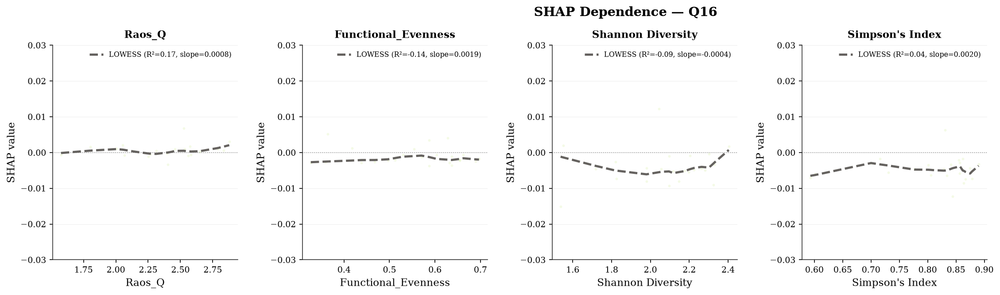

Correlation for Q17: 0.8166666666666667


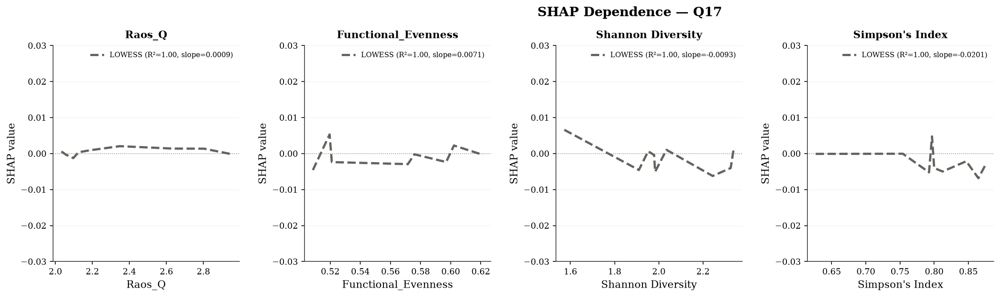

Correlation for Q18: 1.0


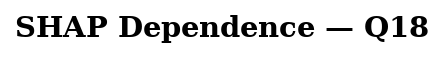

Correlation for Q2: 0.9871051740666739


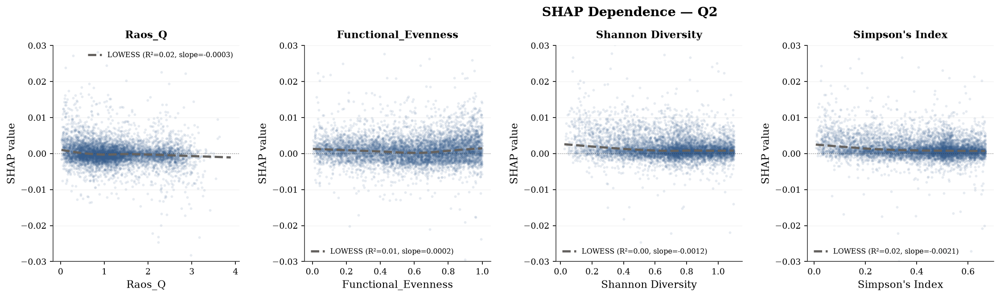

Correlation for Q3: 0.9841975433983525


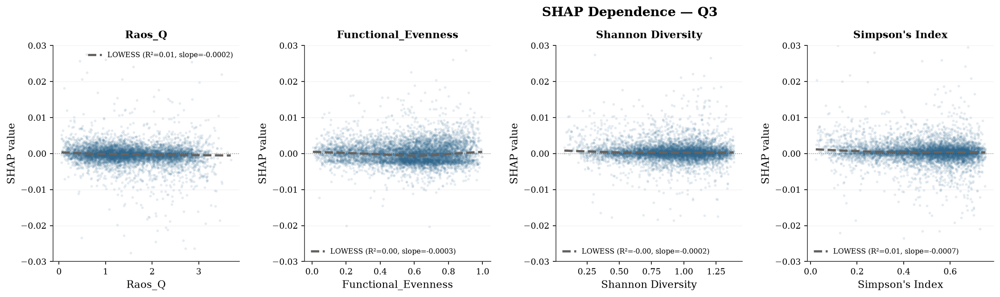

Correlation for Q4: 0.9825314351222749


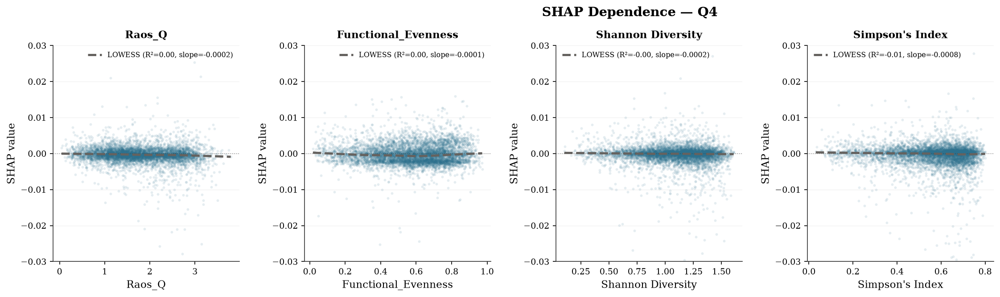

Correlation for Q5: 0.9792111247424449


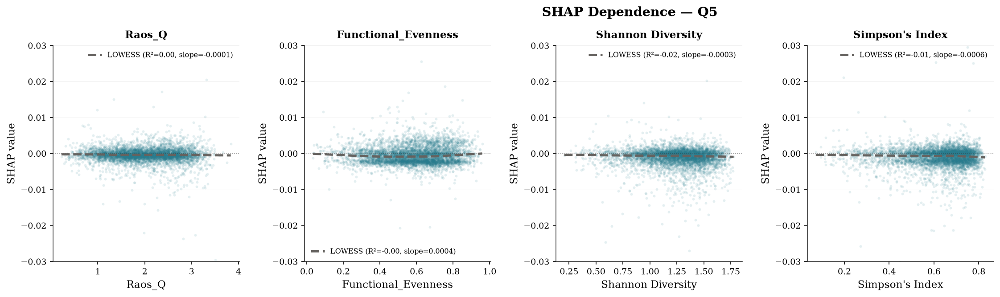

Correlation for Q6: 0.9782300189419458


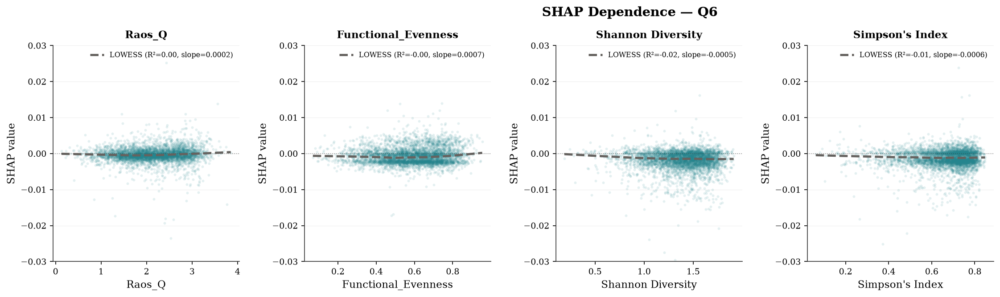

Correlation for Q7: 0.9752939260702689


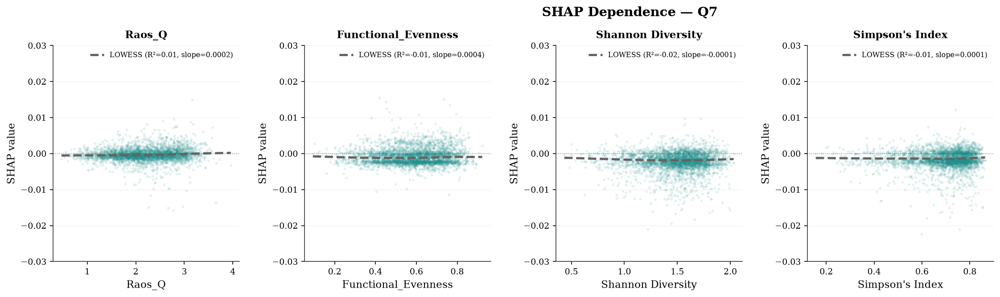

Correlation for Q8: 0.9738364495075507


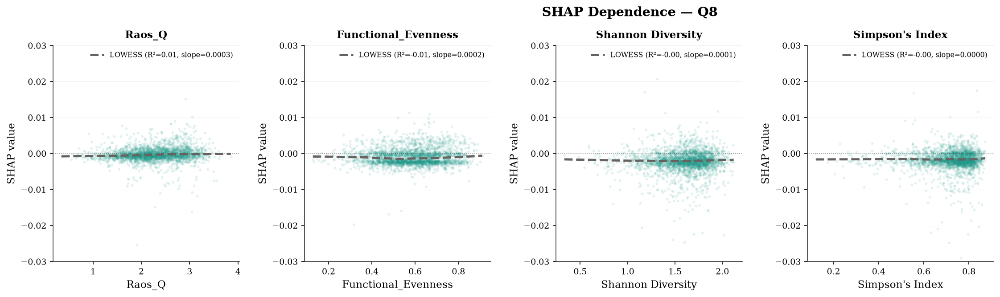

Correlation for Q9: 0.9706720007628675


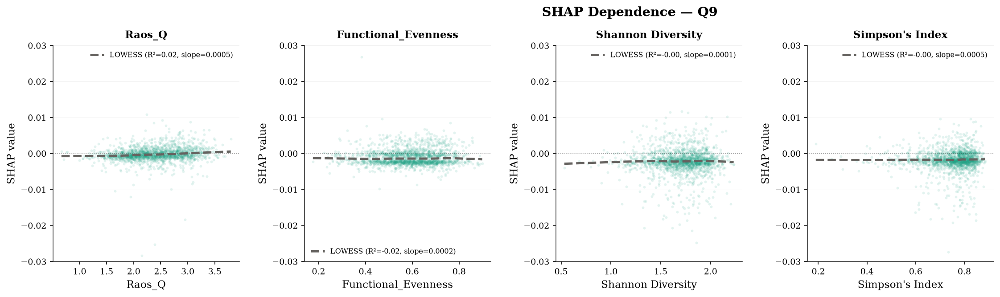

In [ ]:

for group, sub_df in df1.groupby("richness_group"):

    print(f"Correlation for {group}: {sub_df['Shannon Diversity'].corr(sub_df["Simpson's Index"], method='spearman')}")

#     plot_shap_by_continuous(
#     sub_df,
#     features=features,
#     color_var="WSCI",
#     cmap="viridis",
#     color_var_label="WSCI",
# )

    slopes, zeros = plot_shap_with_line_stats_v4(
        sub_df,
        features=features,
        color=species_richness_group_colors.get(group, 'grey'),
        y_axis_limits=(-0.03, 0.03),
        group=group    )
    
    # slopes_df = pd.concat([slopes_df, pd.DataFrame({
    #     'group': group,
    #     'feature': features,
    #     'slope': slopes,
    #     'zero_points': zeros
    # })], ignore_index=True)

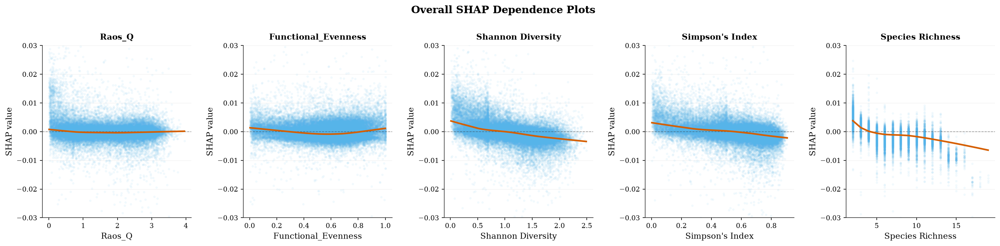

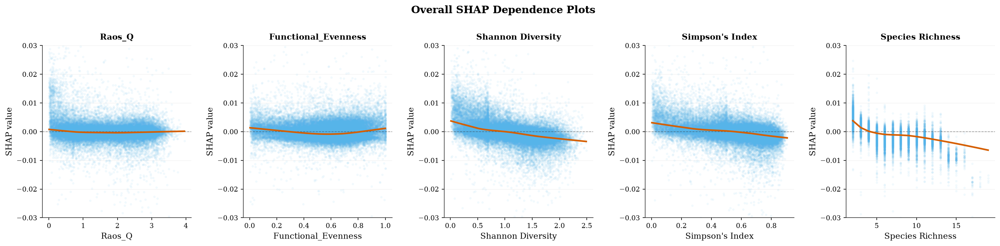

In [57]:
plot_shap(
    df1,
    features=features,
)


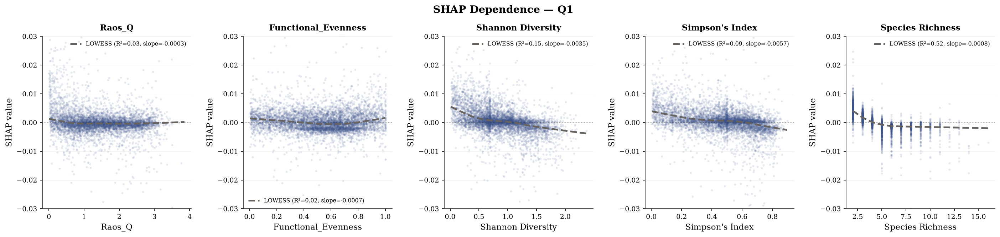

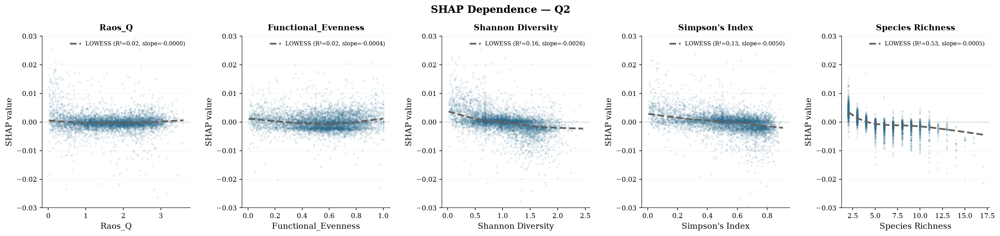

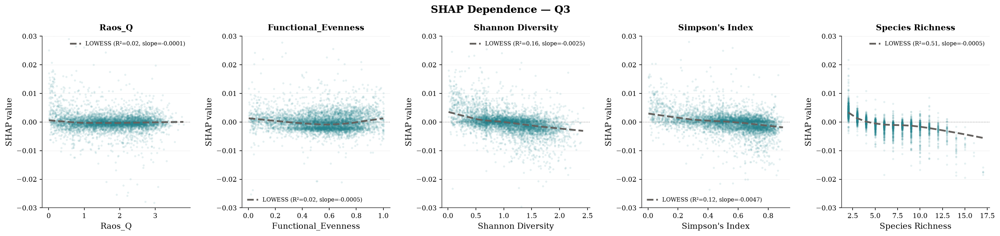

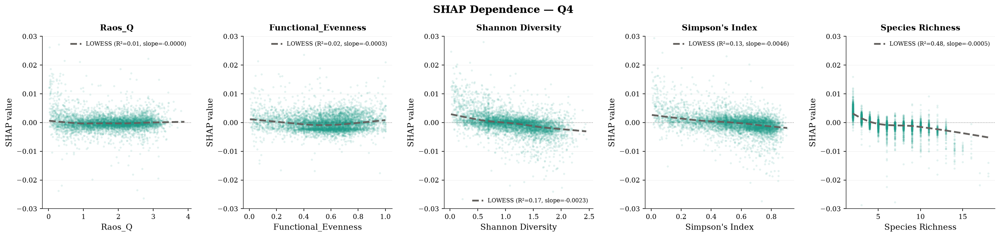

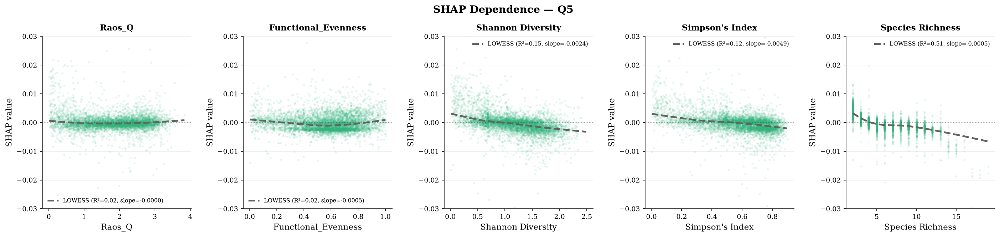

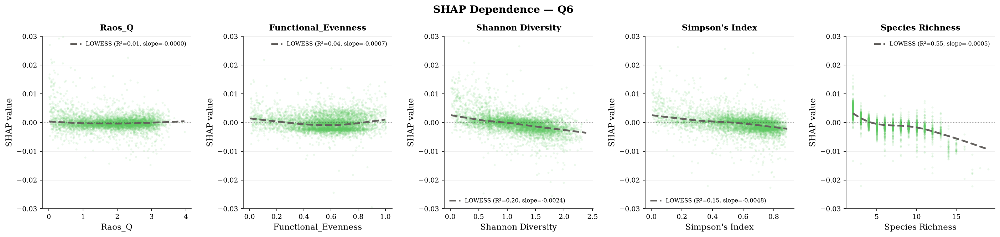

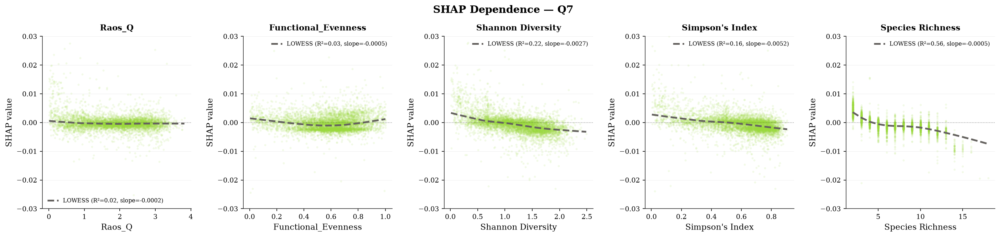

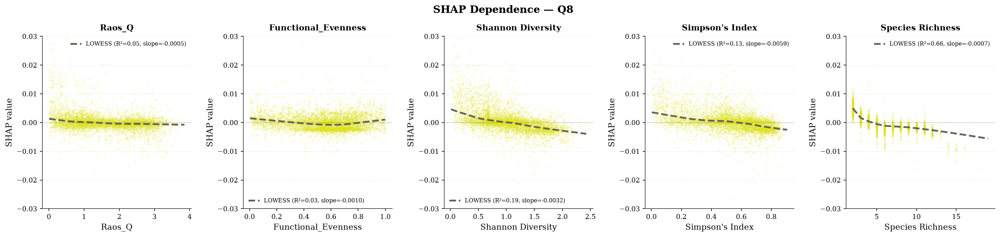

In [59]:

slopes_df = pd.DataFrame(columns=['group', 'feature', 'slope', 'zero_points'])
for group, sub_df in df1.groupby("WSCI_group"):

    slopes, zeros = plot_shap_with_line_stats_v4(
        sub_df,
        features=features,
        color=WSCI_group_colors.get(group, 'grey'),
        y_axis_limits=(-0.03, 0.03),
        group=group    )
    
    slopes_df = pd.concat([slopes_df, pd.DataFrame({
        'group': group,
        'feature': features,
        'slope': slopes,
        'zero_points': zeros
    })], ignore_index=True)

In [ ]:
df2=df1[df1['Slope']>20]

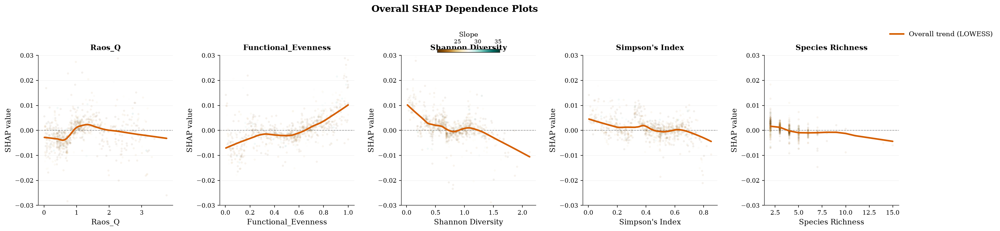

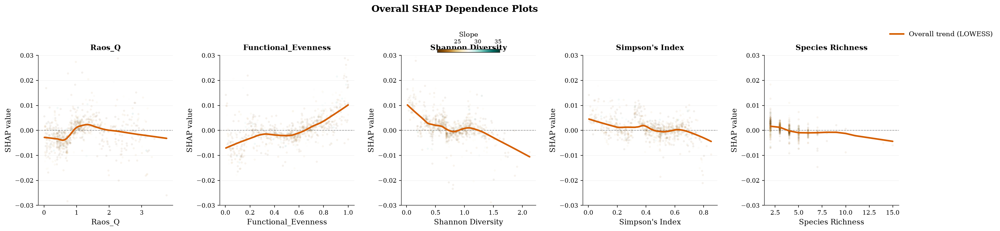

In [ ]:
plot_shap_by_continuous(
    df2,
    features=features,
    color_var="Slope",
    cmap="BrBG",
    color_var_label="Slope",
)

In [ ]:
slopes_df['slope'] = pd.to_numeric(slopes_df['slope'], errors='coerce')

slope_pivot_wsci = slopes_df.pivot(index='group', columns='feature', values='slope')

# keep only diversity features, preserving diversity_vars order
cols = [c for c in features if c in slope_pivot_wsci.columns]
slope_pivot_wsci = slope_pivot_wsci[cols]

# # enforce correct numeric group order (Q1..Q10, not lexicographic)
# group_order = [f"Q{i}" for i in range(1, q + 1)]
# group_order = [g for g in group_order if g in slope_pivot_wsci.index]  # keep only groups present
# slope_pivot_wsci = slope_pivot_wsci.reindex(group_order)

# fig, ax = plt.subplots(figsize=(10, 10))

# sns.heatmap(
#     slope_pivot_wsci    ,
#     cmap='RdYlGn',
#     center=0,
#     annot=True,
#     fmt='.3f',
#     linewidths=0.5,
#     linecolor='white',
#     ax=ax,
#     cbar_kws={'label': 'Slope at SHAP = 0 \n'}
# )

# ax.set_title('Effect of Diversity Features on Stability at different Levels of Structural Complexity', fontsize=13)
# ax.set_xlabel('Feature', fontsize=11)
# ax.set_ylabel('WSCI group', fontsize=11)
# ax.tick_params(axis='x', rotation=45)
# ax.tick_params(axis='y', rotation=0)
# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=9)

# plt.tight_layout()
# plt.show()

NameError: name 'slopes_df' is not defined

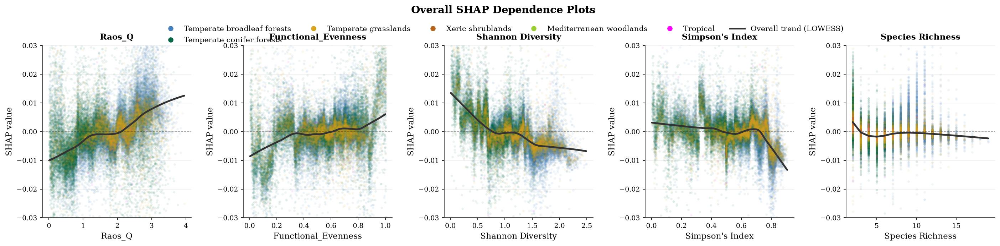

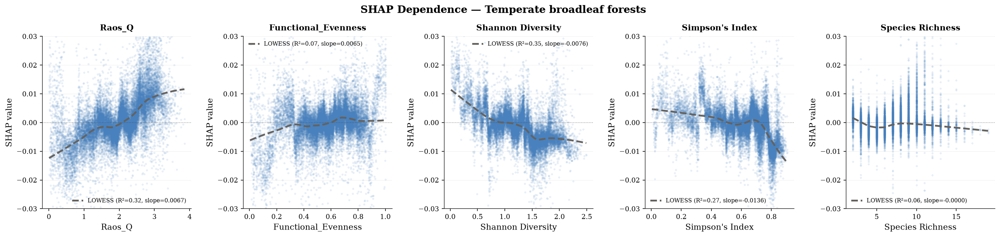

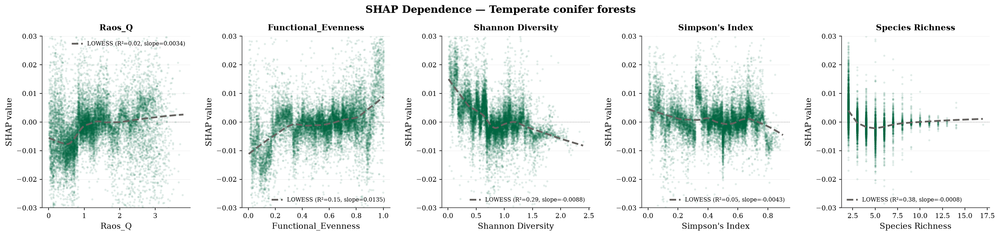

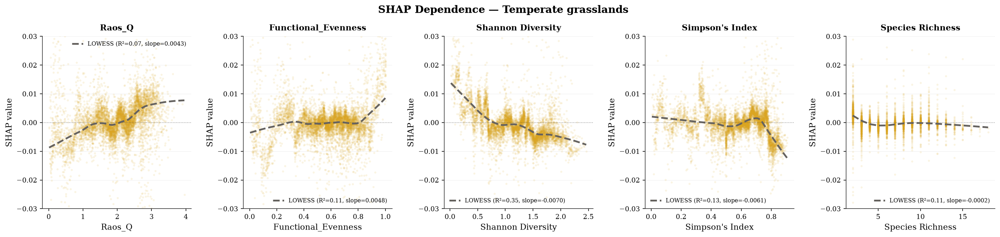

In [ ]:
features = ['Raos_Q', 'Functional_Evenness', 'Shannon Diversity', "Simpson's Index",'Species Richness']

slopes_df_biome=pd.DataFrame(columns=['group', 'feature', 'slope', 'zero_points'])
biomes_of_interest = ['Temperate broadleaf forests', 
                      'Temperate conifer forests', 
                      'Temperate grasslands']

plot_shap_by_group(
    df1,
    features=features,
    group_col="biome",
    group_color_map=biome_colors,
)


for group, sub_df in df1.groupby("biome"):
    if group not in biomes_of_interest:
        continue

    slopes, zeros=plot_shap_with_line_stats_v4(
        sub_df,
        features=features,
        color=biome_colors.get(group, 'grey'),
        y_axis_limits=(-0.03, 0.03),
        group=group,
    )

    slopes_df_biome = pd.concat([slopes_df_biome, pd.DataFrame({
            'group': group,
            'feature': features,
            'slope': slopes,
            'zero_points': zeros
        })], ignore_index=True)

In [ ]:
df1.groupby("biome").size()

biome
Flooded grasslands                19
Mangroves                         12
Mediterranean woodlands           38
Temperate broadleaf forests    22660
Temperate conifer forests      14400
Temperate grasslands            7003
Tropical                          81
Xeric shrublands                 124
dtype: int64

In [ ]:
slopes_df_biome['slope'] = pd.to_numeric(slopes_df_biome['slope'], errors='coerce')

slope_pivot_biome = slopes_df_biome.pivot(index='group', columns='feature', values='slope')

# keep only diversity features, preserving diversity_vars order
cols = [c for c in features if c in slope_pivot_biome.columns]
slope_pivot_biome = slope_pivot_biome[cols]

# fig, ax = plt.subplots(figsize=(10, 10))

# sns.heatmap(
#     slope_pivot_biome,
#     cmap='RdYlGn',
#     center=0,
#     annot=True,
#     fmt='.3f',
#     linewidths=0.5,
#     linecolor='white',
#     ax=ax,
#     cbar_kws={'label': 'Slope at SHAP = 0 \n'}
# )

# ax.set_title('Effect of Diversity Features on Stability of different Biomes', fontsize=13)
# ax.set_xlabel('Feature', fontsize=11)
# ax.set_ylabel('Biome', fontsize=11)
# ax.tick_params(axis='x', rotation=45)
# ax.tick_params(axis='y', rotation=0)
# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=9)

# plt.tight_layout()
# plt.show()

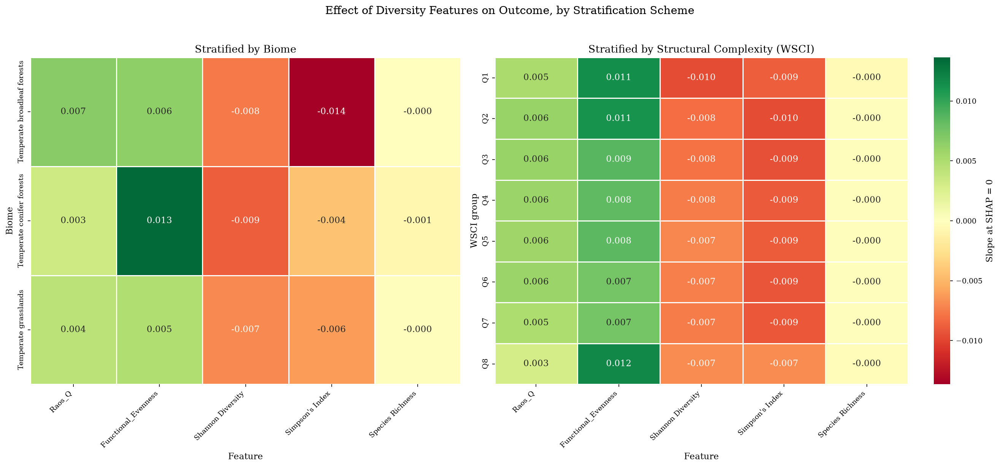

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(18, 8), gridspec_kw={'width_ratios': [1, 1.2]})

# Shared color scale across both heatmaps — critical for fair visual comparison
vmax = max(slope_pivot_biome.abs().max().max(), slope_pivot_wsci.abs().max().max())
vmin = -vmax

sns.heatmap(
    slope_pivot_biome,
    cmap='RdYlGn', center=0, vmin=vmin, vmax=vmax,
    annot=True, fmt='.3f', linewidths=0.5, linecolor='white',
    ax=axes[0], cbar=False,
)
axes[0].set_title('Stratified by Biome', fontsize=13)
axes[0].set_xlabel('Feature', fontsize=11)
axes[0].set_ylabel('Biome', fontsize=11)
axes[0].tick_params(axis='x', rotation=45)

sns.heatmap(
    slope_pivot_wsci,
    cmap='RdYlGn', center=0, vmin=vmin, vmax=vmax,
    annot=True, fmt='.3f', linewidths=0.5, linecolor='white',
    ax=axes[1], cbar_kws={'label': 'Slope at SHAP = 0'},
)
axes[1].set_title('Stratified by Structural Complexity (WSCI)', fontsize=13)
axes[1].set_xlabel('Feature', fontsize=11)
axes[1].set_ylabel('WSCI group', fontsize=11)
axes[1].tick_params(axis='x', rotation=45)

for ax in axes:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=9)

fig.suptitle('Effect of Diversity Features on Outcome, by Stratification Scheme', fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

In [ ]:
# Median split of WSCI within each biome separately
df1["WSCI_level"] = (
    df1.groupby("biome")["WSCI"]
    .transform(lambda x: pd.qcut(x, q=2, labels=["Low", "High"]))
)

df1 = df1[df1["biome"].isin(biomes_of_interest)]

In [ ]:
records = []

for (biome, level), sub in df1.groupby(["biome", "WSCI_level"]):
    for var in features:
        shap_col = f"shap_{var}"
        x = sub[var].values.astype(float)
        y = sub[shap_col].values.astype(float)

        if len(x) < 10 or np.all(x == x[0]):  # guard against tiny/degenerate strata
            continue

        slope, intercept = np.polyfit(x, y, 1)
        records.append({"biome": biome, "WSCI_level": level, "feature": var, "slope": slope, "n": len(x)})

interaction_slopes_df = pd.DataFrame(records)

In [ ]:
pivot_high = interaction_slopes_df[interaction_slopes_df["WSCI_level"]=="High"].pivot(index="biome", columns="feature", values="slope")
pivot_low  = interaction_slopes_df[interaction_slopes_df["WSCI_level"]=="Low"].pivot(index="biome", columns="feature", values="slope")

interaction_effect = pivot_high - pivot_low  # positive = feature effect strengthens at high WSCI

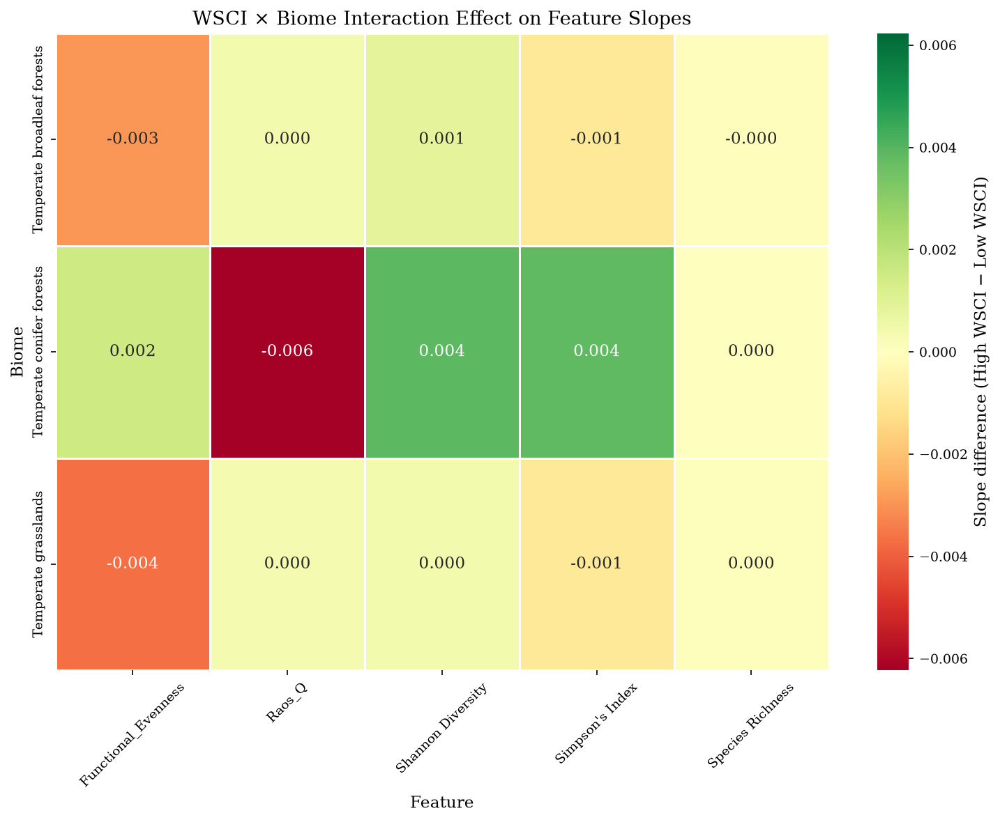

In [ ]:
fig, ax = plt.subplots(figsize=(10, 8))
vmax = interaction_effect.abs().max().max()

sns.heatmap(
    interaction_effect,
    cmap='RdYlGn', center=0, vmin=-vmax, vmax=vmax,
    annot=True, fmt='.3f', linewidths=0.5, linecolor='white',
    ax=ax, cbar_kws={'label': 'Slope difference (High WSCI − Low WSCI)'}
)
ax.set_title('WSCI × Biome Interaction Effect on Feature Slopes', fontsize=13)
ax.set_xlabel('Feature'); ax.set_ylabel('Biome')
ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()